## Taller Deep Learning

Introducción

Importar librerias

In [1]:
import os 
import numpy as np  
from PIL import Image  
import tensorflow as tf  
from sklearn.model_selection import train_test_split  # Importa función para dividir datos en entrenamiento y prueba
from tensorflow.keras.models import Model, Sequential # Importa la clase Model de Keras
from tensorflow.keras.layers import Conv2D, Input, BatchNormalization,MaxPooling2D, Flatten, Dense, Dropout, UpSampling2D  # Importa capas de Keras para construir el modelo
from tensorflow.keras.callbacks import EarlyStopping  # Importa el callback
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

2025-10-03 16:29:15.994322: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2025-10-03 16:29:15.997422: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-10-03 16:29:16.714457: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-10-03 16:29:17.915901: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off,

Redimensionar y normalizar imágenes

In [2]:
# Directorio original y reducido
d_original = '/media/smoke/SSD_D0/bandas/banda13/ene_d_01'
d_reducida = '/media/smoke/SSD_D0/bandas/banda13/ene_d_01_reducida_test'


# Función de redimensionado - TAMAÑO PEQUEÑO PARA PRUEBAS
def resize_npy_images(d_original, d_reducida, new_size):  # Define función para redimensionar imágenes .npy
    if not os.path.exists(d_reducida):  # Si el directorio reducido no existe
        os.makedirs(d_reducida)  # Lo crea
    for filename in os.listdir(d_original):  # Recorre los archivos en el directorio original
        if filename.lower().endswith('.npy'):  # Si el archivo es .npy
            img_path = os.path.join(d_original, filename)  # Construye la ruta completa del archivo
            img_array = np.load(img_path)  # Carga el array de la imagen
             # Redimensionar usando PIL
            img_resized = np.array(Image.fromarray(img_array).resize(new_size, Image.LANCZOS))
            np.save(os.path.join(d_reducida, filename), img_resized)
# Se llama a la función para redimensionar imágenes
resize_npy_images(d_original, d_reducida, new_size=(480, 480))  # Llama la función para redimensionar imágenes a 480x480

# Cargar las 23 imágenes
file_list = sorted([f for f in os.listdir(d_reducida) if f.endswith('.npy')])  # Lista y ordena los archivos .npy
#file_list = file_list[:23]  # Selecciona solo los primeros 23 archivos
print(f"Procesando {len(file_list)} imágenes")  # Imprime la cantidad de imágenes procesadas

images = [np.load(os.path.join(d_reducida, f)) for f in file_list]  # Carga los arrays de las imágenes seleccionadas

# Normalización simple
images = [(img - np.min(img)) / (np.max(img) - np.min(img) + 1e-8) for img in images]
images = [np.clip(img, 0, 1) for img in images]  # Limita los valores al rango [0, 1]

X = np.array(images[:-1])[..., np.newaxis]  # img_t  # Crea array de entrada con dimensión de canal
y = np.array(images[1:])[..., np.newaxis]   # img_t+1  # Crea array de salida (siguiente imagen) con canal

print(f"Forma de X: {X.shape}")  # Imprime la forma del array de entrada
print(f"Forma de y: {y.shape}")  # Imprime la forma del array de salida

Procesando 24 imágenes
Forma de X: (23, 480, 480, 1)
Forma de y: (23, 480, 480, 1)


## modelo basico

In [3]:
# Definición del modelo
from tensorflow.keras.metrics import RootMeanSquaredError, MeanAbsolutePercentageError

model = Sequential([
    Conv2D(16, (3, 3), activation='relu', padding='same', input_shape=X.shape[1:]),
    
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    
    Conv2D(16, (3, 3), activation='relu', padding='same'),
    
    Conv2D(1, (3, 3), activation='linear', padding='same')  # SIN BatchNorm en la salida
])

model.compile(
    optimizer="adam", 
    loss="mse", 
    metrics=[RootMeanSquaredError(), MeanAbsolutePercentageError()]
    )

print("Resumen del modelo:")
model.summary()

# Entrenamiento 15 épocas, batch size 8, early stopping
print("Iniciando entrenamiento de prueba...")

early_stop = EarlyStopping(monitor='loss', patience=10, restore_best_weights=True)

history = model.fit(
    X, y,
    epochs=15,
    batch_size=8,
    callbacks=[early_stop],
    verbose=1
)
print("¡Prueba completada!")
print(f"Pérdida final: {history.history['loss'][-1]:.4f}")

Resumen del modelo:


/home/smoke/datac/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2025-10-03 16:32:33.451051: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 480, 480, 16)   │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 480, 480, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 480, 480, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 480, 480, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 480, 480, 16)   │         4,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 480, 480, 1)    │           145 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 46,529 (181.75 KB)

 Trainable params: 46,529 (181.75 KB)

 Non-trainable params: 0 (0.00 B)

Iniciando entrenamiento de prueba...
Epoch 1/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - loss: 0.3502 - mean_absolute_percentage_error: 444.3359 - root_mean_squared_error: 0.5917
Epoch 2/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - loss: 0.0634 - mean_absolute_percentage_error: 1818.6658 - root_mean_squared_error: 0.2519
Epoch 3/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.0544 - mean_absolute_percentage_error: 2174.9712 - root_mean_squared_error: 0.2331
Epoch 4/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - loss: 0.0342 - mean_absolute_percentage_error: 1456.2544 - root_mean_squared_error: 0.1849
Epoch 5/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - loss: 0.0445 - mean_absolute_percentage_error: 1377.9565 - root_mean_squared_error: 0.2109
Epoch 6/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - loss: 0.0200 - mean_absolute_percentage_error: 1788.0593 - root_mean_squared_error: 0.1415
Epoch 7/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - loss: 0.0256 - mean_absolute_percentage_error: 2055.6746 - root_mean_square

In [4]:
# Obtener las métricas del modelo en el conjunto de entrenamiento
loss, rmse, mape = model.evaluate(X, y, verbose=1)
print(f"Pérdida (MSE): {loss:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"MAPE: {mape:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step - loss: 0.0144 - mean_absolute_percentage_error: 1753.8727 - root_mean_squared_error: 0.1201
Pérdida (MSE): 0.0144
RMSE: 0.1201
MAPE: 1753.8727


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 587ms/step


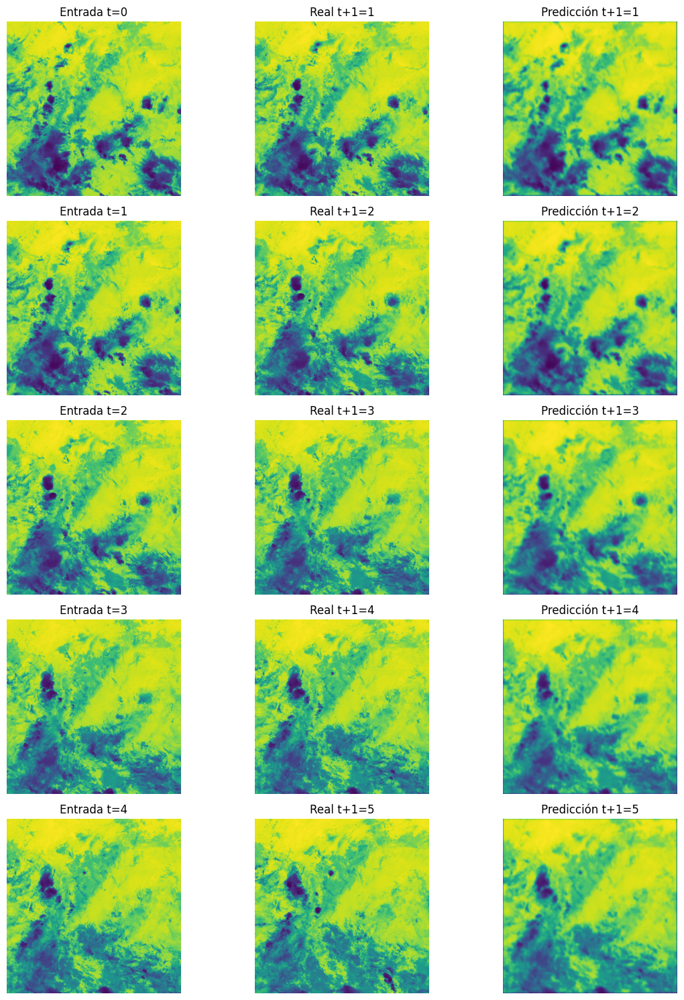

In [5]:
import matplotlib.pyplot as plt

y_pred1 = model.predict(X)  # Genera las predicciones

# Selecciona el número de ejemplos a mostrar
n = 5

# Muestra imágenes reales vs predichas usando un mapa de color
fig, axs = plt.subplots(n, 3, figsize=(12, 3 * n))

for i in range(n):
    axs[i, 0].imshow(X[i, ..., 0], cmap='viridis')
    axs[i, 0].set_title(f'Entrada t={i}')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(y[i, ..., 0], cmap='viridis')
    axs[i, 1].set_title(f'Real t+1={i+1}')
    axs[i, 1].axis('off')

    axs[i, 2].imshow(y_pred1[i, ..., 0], cmap='viridis')
    axs[i, 2].set_title(f'Predicción t+1={i+1}')
    axs[i, 2].axis('off')

plt.tight_layout()
plt.show()

# Modelo con técnicas

In [7]:
# Definición del modelo
from tensorflow.keras.metrics import RootMeanSquaredError, MeanAbsolutePercentageError

model1 = Sequential([
    # Encoder
    Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=X.shape[1:]),
    BatchNormalization(),
    MaxPooling2D((2, 2)),
    Dropout(0.2),

    Conv2D(64, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D((2, 2)),
    Dropout(0.2),

    # Bottleneck
    Conv2D(128, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),

    # Decoder
    UpSampling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),

    UpSampling2D((2, 2)),
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),

    # Output
    Conv2D(1, (3, 3), activation='sigmoid', padding='same')
])

model1.compile(
    optimizer="adam", 
    loss="mse", 
    metrics=[RootMeanSquaredError(), MeanAbsolutePercentageError()]
    )

print("Resumen del modelo:")
model1.summary()

# Entrenamiento 10 épocas, batch size 8, early stopping
print("Iniciando entrenamiento de prueba...")

early_stop = EarlyStopping(monitor='loss', patience=10, restore_best_weights=True)

history1 = model1.fit(
    X, y,
    epochs=15,
    batch_size=8,
    callbacks=[early_stop],
    verbose=1
)
print("¡Prueba completada!")
print(f"Pérdida final: {history1.history['loss'][-1]:.4f}")

Resumen del modelo:


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)              │ (None, 480, 480, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 480, 480, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 240, 240, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 240, 240, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 240, 240, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 240, 240, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 120, 120, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 120, 120, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 120, 120, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 120, 120, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 240, 240, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 240, 240, 64)   │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 240, 240, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_3 (UpSampling2D)  │ (None, 480, 480, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 480, 480, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 480, 480, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 480, 480, 1)    │           289 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 186,497 (728.50 KB)

 Trainable params: 185,857 (726.00 KB)

 Non-trainable params: 640 (2.50 KB)

Iniciando entrenamiento de prueba...
Epoch 1/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 3s/step - loss: 0.0700 - mean_absolute_percentage_error: 1078.0891 - root_mean_squared_error: 0.2645
Epoch 2/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 3s/step - loss: 0.0355 - mean_absolute_percentage_error: 824.1050 - root_mean_squared_error: 0.1883
Epoch 3/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 3s/step - loss: 0.0262 - mean_absolute_percentage_error: 926.5373 - root_mean_squared_error: 0.1618
Epoch 4/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 3s/step - loss: 0.0214 - mean_absolute_percentage_error: 976.5654 - root_mean_squared_error: 0.1463
Epoch 5/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 3s/step - loss: 0.0183 - mean_absolute_percentage_error: 1035.3550 - root_mean_squared_error: 0.1354
Epoch 6/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 3s/step - loss: 0.0169 - mean_absolute_percentage_error: 1095.9966 - root_mean_squared_error: 0.1302
Epoch 7/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 3s/step - loss: 0.0156 - mean_absolute_percentage_error: 1116.3042 - root_mean_s

In [8]:
# Obtener las métricas del modelo en el conjunto de entrenamiento
loss, rmse, mape = model1.evaluate(X, y, verbose=1)
print(f"Pérdida (MSE): {loss:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"MAPE: {mape:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0455 - mean_absolute_percentage_error: 3041.7524 - root_mean_squared_error: 0.2134
Pérdida (MSE): 0.0455
RMSE: 0.2134
MAPE: 3041.7524


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


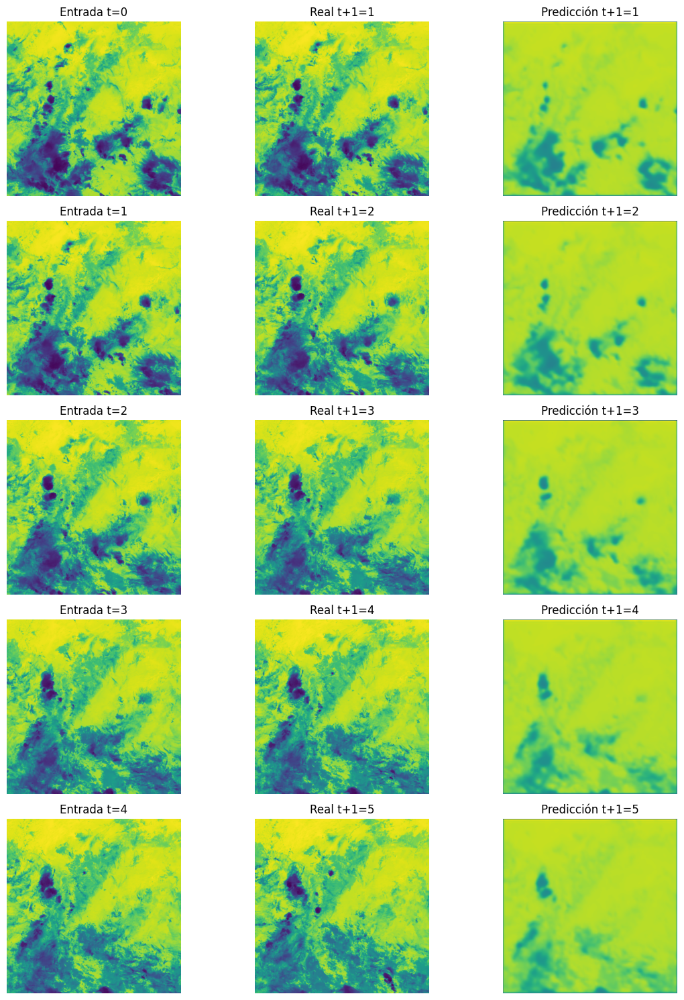

In [9]:
import matplotlib.pyplot as plt

# Selecciona el número de ejemplos a mostrar
n = 5

y_pred = model1.predict(X)  # Genera las predicciones

# Muestra imágenes reales vs predichas usando un mapa de color
fig, axs = plt.subplots(n, 3, figsize=(12, 3 * n))

for i in range(n):
    axs[i, 0].imshow(X[i, ..., 0], cmap='viridis')
    axs[i, 0].set_title(f'Entrada t={i}')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(y[i, ..., 0], cmap='viridis')
    axs[i, 1].set_title(f'Real t+1={i+1}')
    axs[i, 1].axis('off')

    axs[i, 2].imshow(y_pred[i, ..., 0], cmap='viridis')
    axs[i, 2].set_title(f'Predicción t+1={i+1}')
    axs[i, 2].axis('off')

plt.tight_layout()
plt.show()

In [7]:
print("Valores reales:", np.min(y), np.max(y))
print("Valores predichos:", np.min(y_pred), np.max(y_pred))

Valores reales: 0.0 1.0
Valores predichos: 0.16423309 0.61714697


Resumen del modelo:


/home/fisica/data/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_24 (Conv2D)              │ (None, 480, 480, 16)   │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_25 (Conv2D)              │ (None, 480, 480, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_26 (Conv2D)              │ (None, 480, 480, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_27 (Conv2D)              │ (None, 480, 480, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_28 (Conv2D)              │ (None, 480, 480, 16)   │         4,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_29 (Conv2D)              │ (None, 480, 480, 1)    │           145 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 46,529 (181.75 KB)

 Trainable params: 46,529 (181.75 KB)

 Non-trainable params: 0 (0.00 B)

Iniciando entrenamiento de prueba...
Epoch 1/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 52s 17s/step - loss: 0.2128 - mean_absolute_percentage_error: 1481.4523 - root_mean_squared_error: 0.4613
Epoch 2/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 52s 17s/step - loss: 0.1958 - mean_absolute_percentage_error: 1469.0551 - root_mean_squared_error: 0.4424
Epoch 3/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 49s 16s/step - loss: 0.1792 - mean_absolute_percentage_error: 1353.6932 - root_mean_squared_error: 0.4234
Epoch 4/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 50s 16s/step - loss: 0.1644 - mean_absolute_percentage_error: 1350.7645 - root_mean_squared_error: 0.4055
Epoch 5/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 49s 16s/step - loss: 0.1515 - mean_absolute_percentage_error: 1307.5020 - root_mean_squared_error: 0.3893
Epoch 6/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 50s 16s/step - loss: 0.1368 - mean_absolute_percentage_error: 1247.5399 - root_mean_squared_error: 0.3699
Epoch 7/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 50s 16s/step - loss: 0.1251 - mean_absolute_percentage_error: 1156.7548 - r

In [17]:
# Obtener las métricas del modelo en el conjunto de entrenamiento
loss, rmse, mape = model1.evaluate(X, y, verbose=1)
print(f"Pérdida (MSE): {loss:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"MAPE: {mape:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.5809 - mean_absolute_percentage_error: 181.0937 - root_mean_squared_error: 0.7622
Pérdida (MSE): 0.5809
RMSE: 0.7622
MAPE: 181.0937


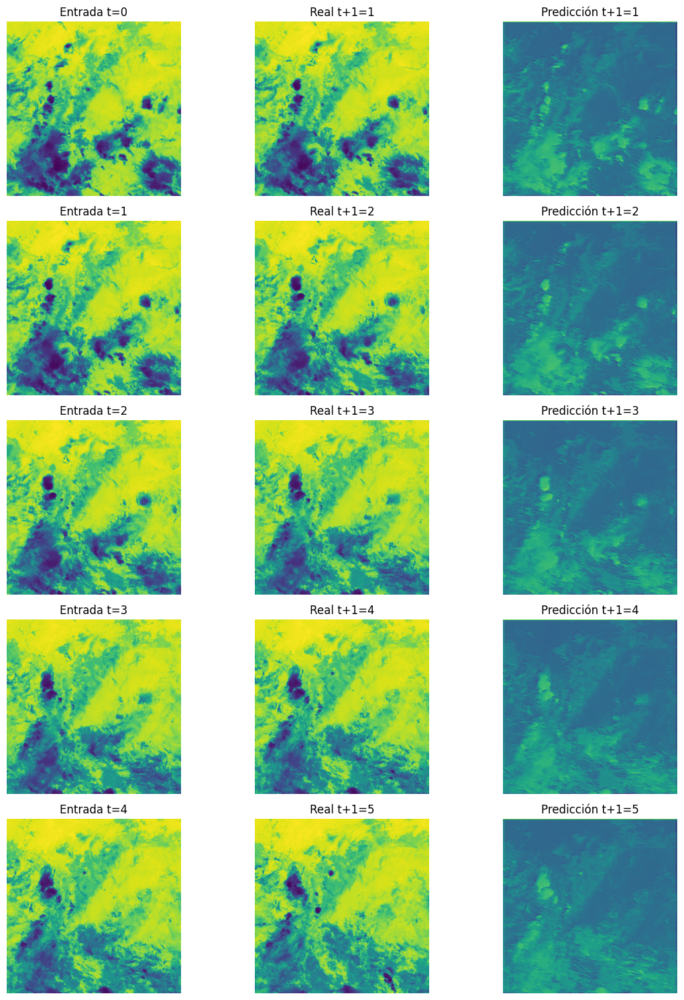

In [19]:
import matplotlib.pyplot as plt

# Selecciona el número de ejemplos a mostrar
n = 5

# Muestra imágenes reales vs predichas usando un mapa de color
fig, axs = plt.subplots(n, 3, figsize=(12, 3 * n))

for i in range(n):
    axs[i, 0].imshow(X[i, ..., 0], cmap='viridis')
    axs[i, 0].set_title(f'Entrada t={i}')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(y[i, ..., 0], cmap='viridis')
    axs[i, 1].set_title(f'Real t+1={i+1}')
    axs[i, 1].axis('off')

    axs[i, 2].imshow(y_pred[i, ..., 0], cmap='viridis')
    axs[i, 2].set_title(f'Predicción t+1={i+1}')
    axs[i, 2].axis('off')

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


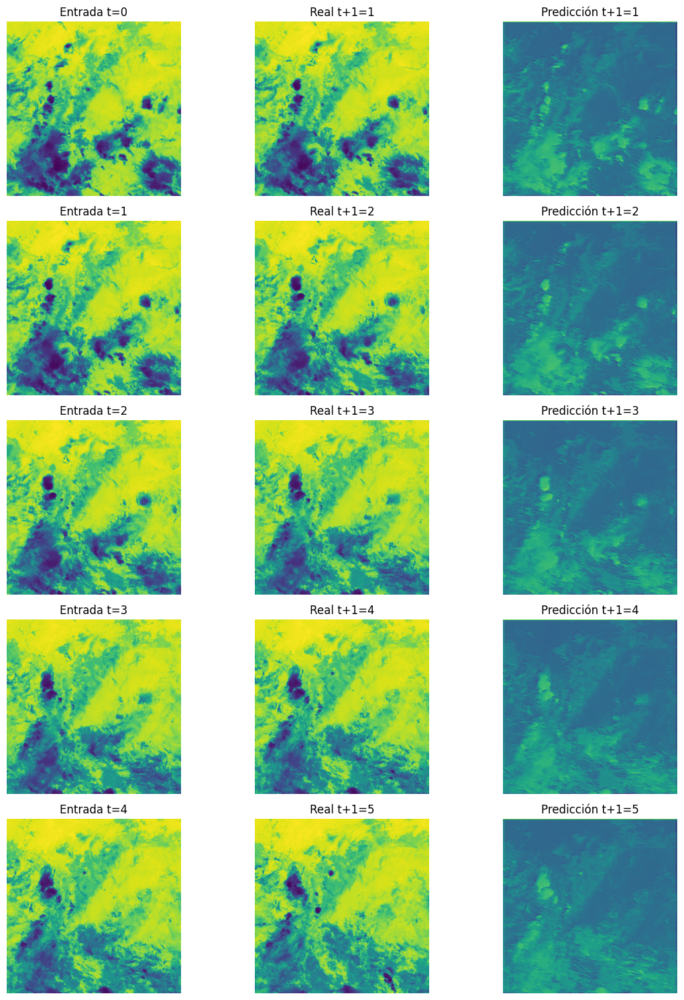

In [18]:
import matplotlib.pyplot as plt

# Selecciona el número de ejemplos a mostrar
n = 5

y_pred = model1.predict(X)  # Genera las predicciones

# Muestra imágenes reales vs predichas usando un mapa de color
fig, axs = plt.subplots(n, 3, figsize=(12, 3 * n))

for i in range(n):
    axs[i, 0].imshow(X[i, ..., 0], cmap='viridis')
    axs[i, 0].set_title(f'Entrada t={i}')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(y[i, ..., 0], cmap='viridis')
    axs[i, 1].set_title(f'Real t+1={i+1}')
    axs[i, 1].axis('off')

    axs[i, 2].imshow(y_pred[i, ..., 0], cmap='viridis')
    axs[i, 2].set_title(f'Predicción t+1={i+1}')
    axs[i, 2].axis('off')

plt.tight_layout()
plt.show()

### Usando 2 canales el 9 y el 13

In [6]:
# Directorio de las nuevas imágenes 920x920 y su destino reducido
d_original_9 = '/home/fisica/bandas/banda9/ene_01'  # Cambia esta ruta por la ubicación real
d_reducida_9 = '/home/fisica/bandas/banda9/ene_01_reducida'  # Cambia esta ruta por el destino deseado

# Redimensionar las imágenes 920x920 a 480x480 usando la función existente
resize_npy_images(d_original_9, d_reducida_9, new_size=(480, 480))

# Cargar las 23 imágenes
file_list = sorted([f for f in os.listdir(d_reducida_9) if f.endswith('.npy')])  # Lista y ordena los archivos .npy
file_list = file_list[:23]  # Selecciona solo los primeros 23 archivos
print(f"Procesando {len(file_list)} imágenes")  # Imprime la cantidad de imágenes procesadas

images_9 = [np.load(os.path.join(d_reducida_9, f)) for f in file_list]  # Carga los arrays de las imágenes seleccionadas

# Normalización simple
images_9 = [(img - np.min(img)) / (np.max(img) - np.min(img) + 1e-8) for img in images_9]
images_9 = [np.clip(img, 0, 1) for img in images_9]  # Limita los valores al rango [0, 1]
X_1 = np.array(images_9[:-1])[..., np.newaxis]  # img_t  # Crea array de entrada con dimensión de canal
y_1 = np.array(images_9[1:])[..., np.newaxis]   # img_t+1  # Crea array de salida (siguiente imagen) con canal


Procesando 23 imágenes


In [ ]:
X_multi = np.concatenate([X, X_1], axis=-1)  # (n, 480, 480, 2)
y_multi = np.concatenate([y, y_1], axis=-1)  # (n, 480, 480, 2)

model = Sequential([
    Conv2D(16, (3, 3), activation='relu', padding='same', input_shape=X_multi.shape[1:]),
    BatchNormalization(),  # 1. Después de la primera capa
    
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),  # 2. Después de la segunda capa
    
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),  # 3. Después de la tercera capa (pico del encoder)
    
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),  # 4. Después de la cuarta capa
    
    Conv2D(16, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),  # 5. Después de la quinta capa
    
    Conv2D(1, (3, 3), activation='linear', padding='same')  # SIN BatchNorm en la salida
])

model.compile(
    optimizer="adam", 
    loss="mse", 
    metrics=[RootMeanSquaredError(), MeanAbsolutePercentageError()]
    )

print("Resumen del modelo:")
model.summary()

# Entrenamiento rápido - solo 3 épocas
print("Iniciando entrenamiento de prueba...")

early_stop = EarlyStopping(monitor='loss', patience=10, restore_best_weights=True)

history = model.fit(
    X_multi, y_multi,
    epochs=10,
    batch_size=8,
    callbacks=[early_stop],
    verbose=1
)
print("¡Prueba completada!")
print(f"Pérdida final: {history.history['loss'][-1]:.4f}")



Resumen del modelo:


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)              │ (None, 480, 480, 16)   │           304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 480, 480, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 480, 480, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 480, 480, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 480, 480, 16)   │         4,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 480, 480, 1)    │           145 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 46,673 (182.32 KB)

 Trainable params: 46,673 (182.32 KB)

 Non-trainable params: 0 (0.00 B)

Iniciando entrenamiento de prueba...
Epoch 1/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 25s 8s/step - loss: 0.5740 - mae: 0.5740
Epoch 2/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 24s 8s/step - loss: 0.2423 - mae: 0.2423
Epoch 3/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 24s 8s/step - loss: 0.1871 - mae: 0.1871
Epoch 4/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 24s 8s/step - loss: 0.1903 - mae: 0.1903
Epoch 5/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 24s 8s/step - loss: 0.1215 - mae: 0.1215
Epoch 6/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 24s 7s/step - loss: 0.1348 - mae: 0.1348
Epoch 7/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 7s/step - loss: 0.1039 - mae: 0.1039
Epoch 8/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 7s/step - loss: 0.1135 - mae: 0.1135
Epoch 9/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 7s/step - loss: 0.0999 - mae: 0.0999
Epoch 10/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 24s 8s/step - loss: 0.0967 - mae: 0.0967
¡Prueba completada!
Pérdida final: 0.0967


2025-09-24 19:56:04.348934: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:84] Allocation of 648806400 exceeds 10% of free system memory.
2025-09-24 19:56:04.627000: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:84] Allocation of 1297612800 exceeds 10% of free system memory.


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


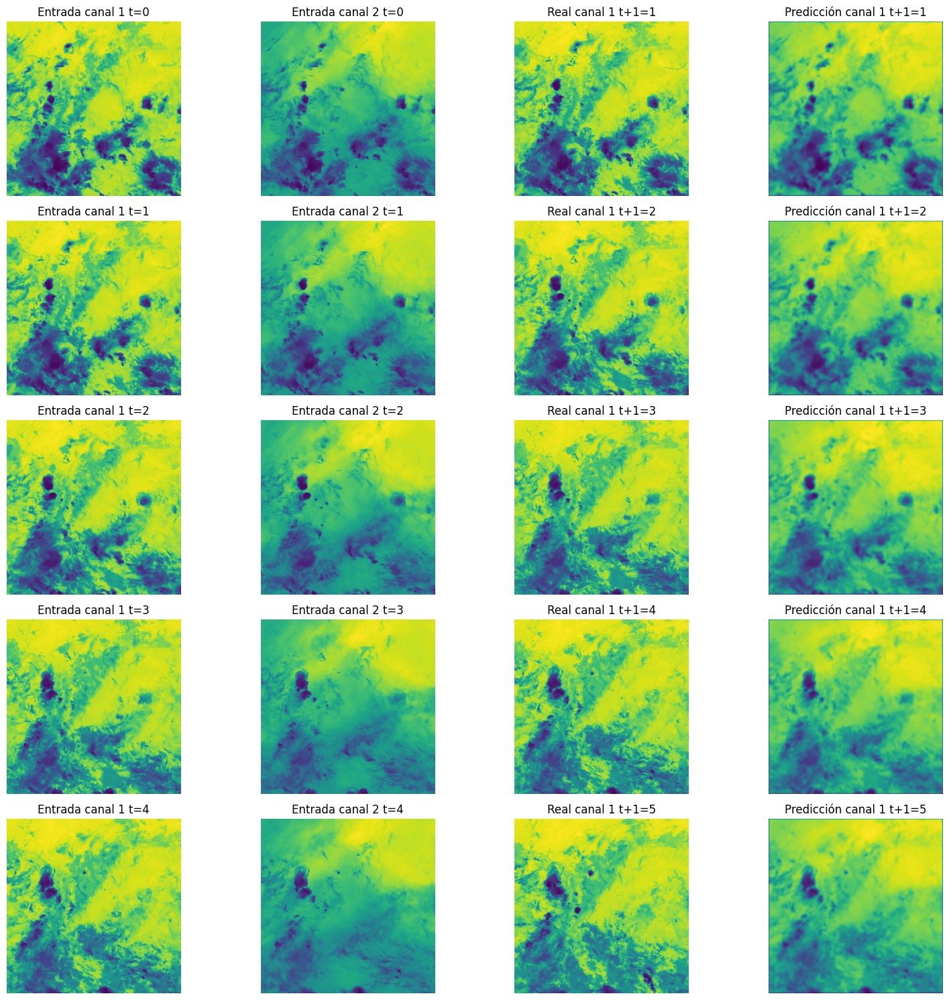

In [8]:
import matplotlib.pyplot as plt

# Generar predicciones con el modelo entrenado
y_pred = model.predict(X_multi)

# Número de ejemplos a mostrar
n = 5

fig, axs = plt.subplots(n, 4, figsize=(16, 3 * n))

for i in range(n):
    axs[i, 0].imshow(X_multi[i, ..., 0], cmap='viridis')
    axs[i, 0].set_title(f'Entrada canal 1 t={i}')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(X_multi[i, ..., 1], cmap='viridis')
    axs[i, 1].set_title(f'Entrada canal 2 t={i}')
    axs[i, 1].axis('off')

    axs[i, 2].imshow(y_multi[i, ..., 0], cmap='viridis')
    axs[i, 2].set_title(f'Real canal 1 t+1={i+1}')
    axs[i, 2].axis('off')

    axs[i, 3].imshow(y_pred[i, ..., 0], cmap='viridis')
    axs[i, 3].set_title(f'Predicción canal 1 t+1={i+1}')
    axs[i, 3].axis('off')

plt.tight_layout()
plt.show()